<img src="https://drive.google.com/uc?export=view&id=15W0WXOWOd3gp67glg94sQHr_cIzLMzze">

<h1>Lesson 7 - 影像處理</h1>

MIT License. Copyright (c) 2020 LisaTsai in CAVEDU



OpenCV 參考網站 : https://opencv.org/

## 課程大綱

+ #### 補充: Pytube下載影片

+ #### 影像處理-OpenCV
    + 圖片處理功能介紹
+ #### 人臉偵測
+ #### 物體追蹤

==============

### 補充: Pytube下載影片

https://python-pytube.readthedocs.io/en/latest/

In [1]:
####安裝下載影片的套件pytube####
import sys
!{sys.executable} -m pip install pytube
###############################

#匯入函式庫
from pytube import YouTube

#問使用者要下載影片的youtube網址，不是每個都work
url =input('請輸入你要下載的youtube網址： ')

print('下載 來自'+url+' 的youtube影片中...')
#下載影片!
YouTube(url).streams.first().download()

請輸入你要下載的youtube網址：  https://www.youtube.com/watch?v=82QHK29q9As


下載 來自https://www.youtube.com/watch?v=82QHK29q9As 的youtube影片中...


'C:\\Users\\ADMIN\\Desktop\\Lesson7 - 影像處理\\[풀버전] ♬ wish you were gay - 구오 @3차 경연 컴백전쟁  퀸덤 7화.mp4'

# 影像處理-OpenCV

### 安裝OpenCV for Python

In [2]:
import sys
!{sys.executable} -m pip install opencv-python

### 匯入函式庫

In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

### 取得目前的工作資料夾位置

In [4]:
print(os.getcwd())

C:\Users\ADMIN\Desktop\Lesson7 - 影像處理


### 讀取、儲存及顯示圖片

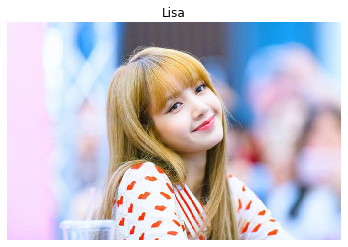

In [5]:
#讀取圖片
img = cv2.imread('Lisa.jpg')

#顯示ndarray格式的圖片數據
#print(img)

#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
rgb_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#指定plt等等要顯示的圖片
plt.imshow(rgb_img)

#設定圖片標題
plt.title("Lisa")

#去掉xy軸
plt.axis('off')

#儲存照片的不同方式，選一個就好，你覺得有什麼不同呢?
plt.savefig("plt_img.png", bbox_inches='tight')
cv2.imwrite("cv2_img_before.png",img)
cv2.imwrite("cv2_img_after.png",rgb_img)

#顯示圖片
plt.show()

### 另一種顯示桌面上圖檔的方法

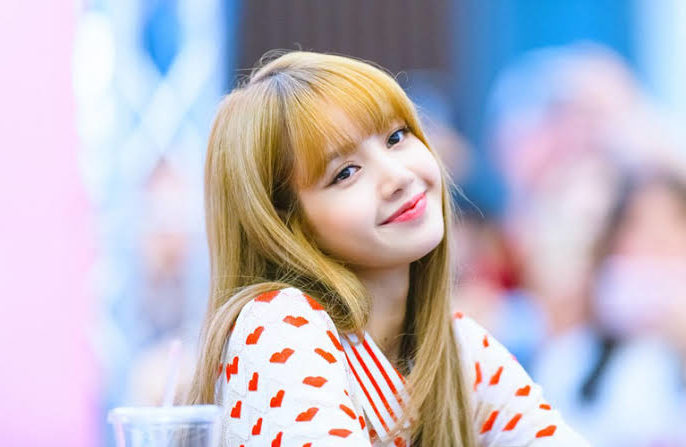

In [6]:
from IPython.display import Image
Image(filename="Lisa.jpg")

### 加上文字內容

cv2.putText(影像, 文字, 座標, 字型, 大小, 顏色, 線條寬度, 線條種類)

常見字體:
+ cv2.FONT_HERSHEY_SIMPLEX
+ cv2.FONT_HERSHEY_PLAIN
+ cv2.FONT_HERSHEY_DUPLEX
+ cv2.FONT_HERSHEY_COMPLEX
+ cv2.FONT_HERSHEY_TRIPLEX
+ cv2.FONT_HERSHEY_COMPLEX_SMALL
+ cv2.FONT_HERSHEY_SCRIPT_SIMPLEX
+ cv2.FONT_HERSHEY_SCRIPT_COMPLEX


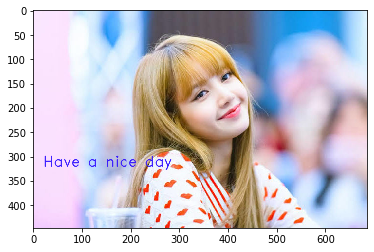

In [9]:
#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
rgb_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#設定文字內容
text = "Have a nice day"

#設定文字在圖片上的細節
cv2.putText(rgb_img, text, (20, 320), cv2.FONT_HERSHEY_DUPLEX,
  1, (50, 20, 255), 1, cv2.LINE_AA)

#設定要顯示的圖片
plt.imshow(rgb_img)
cv2.imwrite("cv2_img_put_text.png", cv2.cvtColor(rgb_img,cv2.COLOR_BGR2RGB))
plt.show()

### 使用中文字體 (Lesson5複習-ttf字型檔)
+ PIL (Python Imaging Library) - 影像處理套件
+ ImageFont.truetype(字型路徑, 字體大小)
+ draw_img.text(位置, 文字, 字體, 文字顏色)

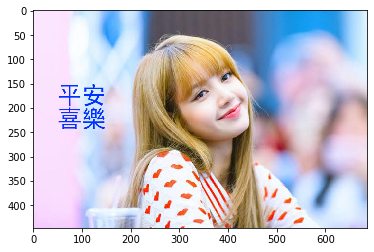

In [10]:
from PIL import ImageFont, ImageDraw, Image

#設定文字
text = '平安\n喜樂'

#設定字體檔
fontPath = "SimHei.ttf"

#載入字體
font = ImageFont.truetype(fontPath, 50)

#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
rgb_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#將ndarray轉為PIL影像
pil_img = Image.fromarray(rgb_img)

#在圖片上加入文字
draw_img = ImageDraw.Draw(pil_img)
draw_img.text((50, 150), text, font=font, fill=(0, 50, 255))

#將PIL影像轉回ndarray
result_img = np.array(pil_img)

#設定要顯示的圖片
plt.imshow(result_img)
cv2.imwrite("cv2_img_put_text_ch.png", cv2.cvtColor(result_img,cv2.COLOR_BGR2RGB))
plt.show()

### 組圖

+ 使用matplotlib的subplot-subplot(總共幾行, 總共幾列, 第幾個)
+ 使用numpy的hstack-hstack([圖片一的numpy陣列, 圖片二的numpy陣列, 圖片三的numpy陣列])

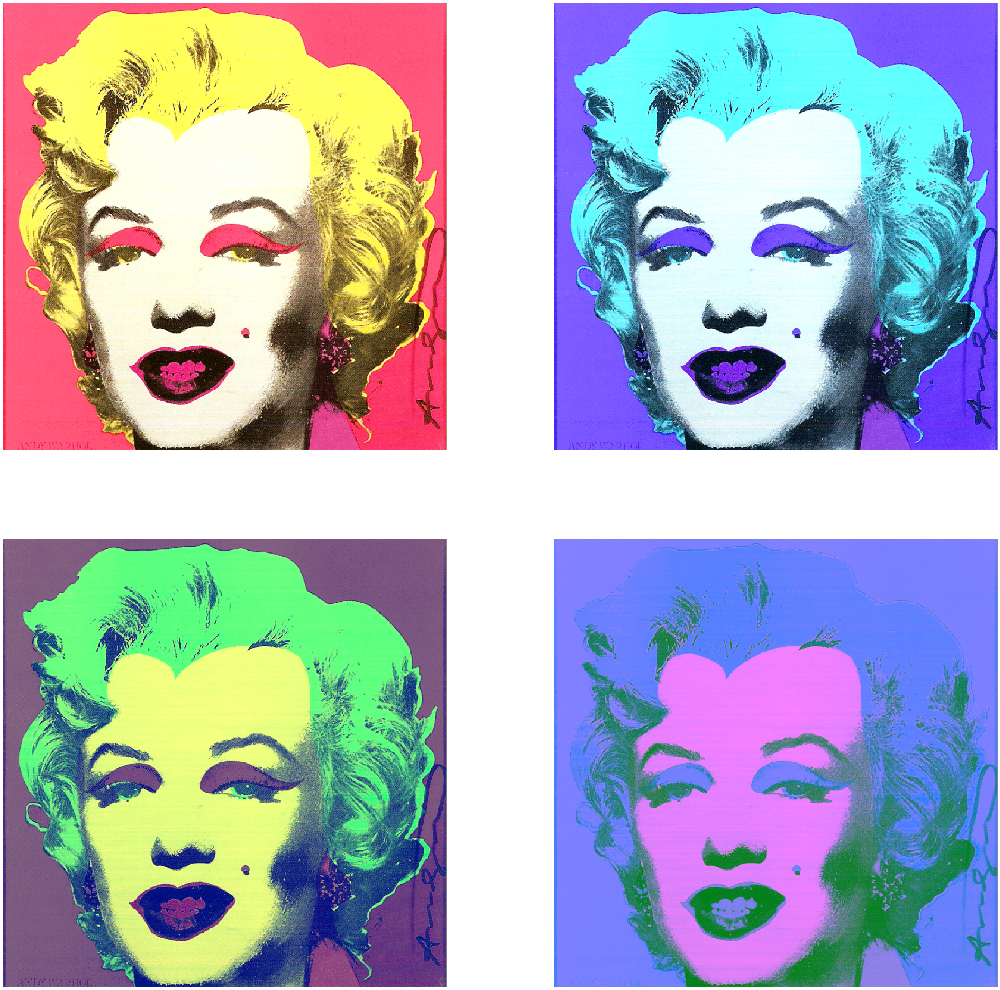

In [11]:
###### Matplotlib的subplot組圖

#讀取圖片
img = cv2.imread("pop.png")

plt.figure(figsize=(40,40))

#設定原圖為兩行兩列當中的第一張圖片
plt.subplot(2,2,1)     
#plt.title('origin image',fontsize=40)  
#將座標取消
plt.axis('off')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(img)    


#設定原圖為兩行兩列當中的第二張圖片
plt.subplot(2,2,2)    
#plt.title('BGR',fontsize=40)  
#複製原始圖片
bgr = img.copy()
#將座標取消
plt.axis('off')
bgr = cv2.cvtColor(bgr,cv2.COLOR_BGR2RGB)
plt.imshow(bgr) 

#設定原圖為兩行兩列當中的第三張圖片
plt.subplot(2,2,3)    
#plt.title('B channel',fontsize=40)   
#複製原始圖片
new_blue = img.copy()
#將藍色通道統一改成128
new_blue[:,:,0] = 128
#將座標取消
plt.axis('off') 
new_blue = cv2.cvtColor(new_blue,cv2.COLOR_BGR2RGB)
plt.imshow(new_blue) 

#設定原圖為兩行兩列當中的第四張圖片
plt.subplot(2,2,4)     
#plt.title('G channel',fontsize=40)  
#複製原始圖片
new_green = img.copy()
#將綠色通道統一改成128
new_green[:,:,1] = 128
#將座標取消
plt.axis('off')  
new_green = cv2.cvtColor(new_green,cv2.COLOR_BGR2RGB)
plt.imshow(new_green) 

#顯示組圖
plt.show()  



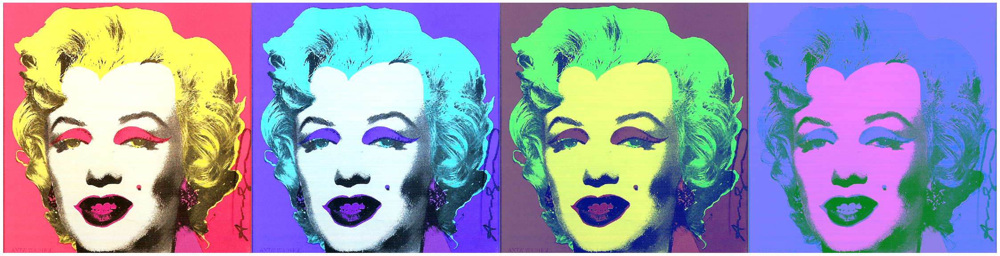

In [12]:
### 使用numpy的hstack, vstack

#調整圖片大小
plt.figure(figsize=(40,40))

#組圖
result = np.hstack([img, bgr, new_blue, new_green])

#設定要顯示的圖片
plt.imshow(result)

#不顯示座標
plt.axis('off')

#顯示圖片
plt.show()

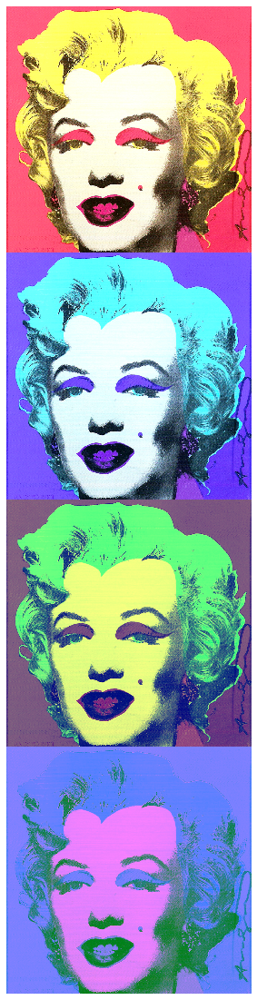

In [13]:
### 使用numpy的vstack

#調整圖片大小
plt.figure(figsize=(20,20))

#組圖
result = np.vstack([img, bgr, new_blue, new_green])

#設定要顯示的圖片
plt.imshow(result)

#不顯示座標
plt.axis('off')

#顯示圖片
plt.show()

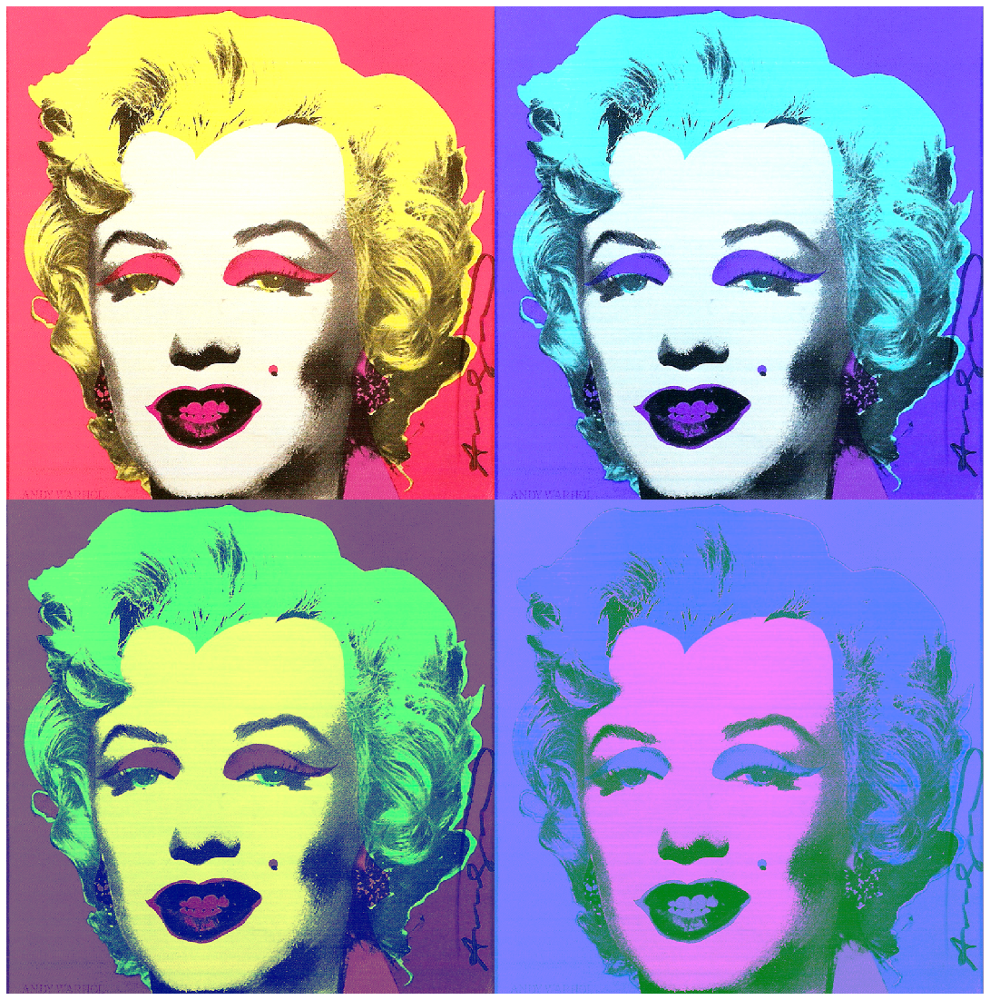

In [14]:
### 綜合使用numpy的hstack,vstack

#調整圖片大小
plt.figure(figsize=(20,20))

#組圖
result = np.vstack([np.hstack([img, bgr]), np.hstack([new_blue, new_green])])

#設定要顯示的圖片
plt.imshow(result)

#不顯示座標
plt.axis('off')

#儲存圖片
cv2.imwrite("cv2_img_combination.png", cv2.cvtColor(result,cv2.COLOR_BGR2RGB))

#顯示圖片
plt.show()

### 模糊化

兩種常見的模糊化方法:

+ 均值濾波-blur(原始圖片,kernel大小)
    + 缺點:無法保留圖像細節
+ 高斯濾波-GaussianBlur(原始圖片, kernel大小, 高斯函數在X方向上的標準偏差, 高斯函數在Y方向上的標準偏差)
    + 優點:減少雜訊
  
  
+ 還有其他各式各樣的模糊化方法，有興趣的人可以再進一步研究唷!
    + 方框濾波-boxblur
    + 中值濾波-medianBlur
    + 雙邊濾波-bilateralFilter

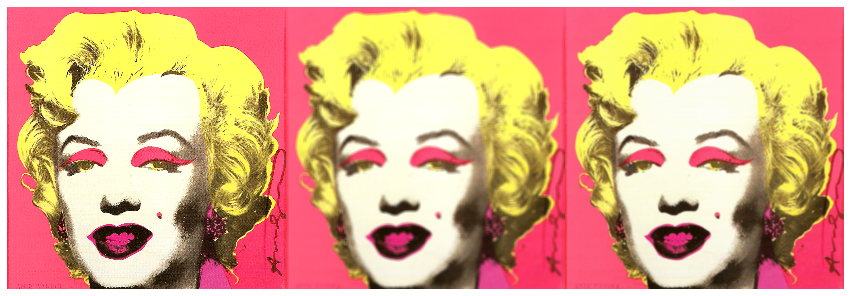

In [15]:
#讀取圖片
img = cv2.imread("pop.png")

#圖片模糊化
blur = cv2.blur(img, (11, 11))
gau_blur = cv2.GaussianBlur(img, (11, 11), 0, 0)

#組圖
result = np.hstack([img, blur, gau_blur])

#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
result = cv2.cvtColor(result,cv2.COLOR_BGR2RGB)

#設定顯示圖片大小
plt.figure(figsize=(15,45)) 

#設定要顯示的圖片
plt.imshow(result)

#不顯示座標
plt.axis('off')

#儲存圖片
cv2.imwrite("cv2_img_blur.png", cv2.cvtColor(blur,cv2.COLOR_BGR2RGB))
cv2.imwrite("cv2_img_gaussian_blur.png", cv2.cvtColor(gau_blur,cv2.COLOR_BGR2RGB))
#顯示圖片
plt.show()

### 銳利化(體驗)
+ 使用特殊kernel達成銳利化

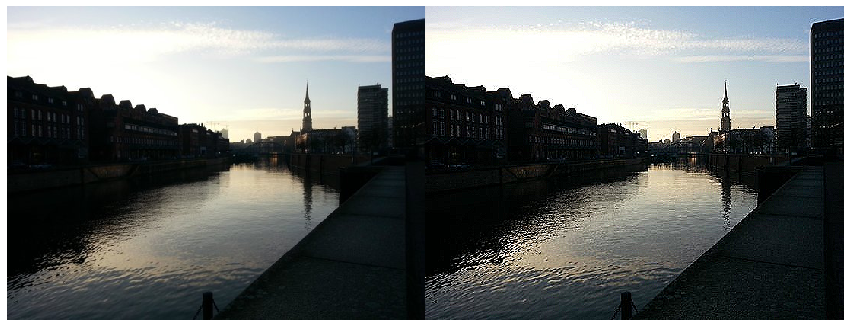

In [16]:
#讀取圖片
img = cv2.imread("bridge.jpg")

#圖片銳利化
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], np.float32)
sharp = cv2.filter2D(img, -1, kernel=kernel)

#組圖
result = np.hstack([img, sharp])

#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
result = cv2.cvtColor(result,cv2.COLOR_BGR2RGB)

#設定顯示圖片大小
plt.figure(figsize=(15,45)) 

#設定要顯示的圖片
plt.imshow(result)

#不顯示座標
plt.axis('off')

#儲存圖片
cv2.imwrite("cv2_img_sharp.png", cv2.cvtColor(sharp,cv2.COLOR_BGR2RGB))

#顯示圖片
plt.show()

### 漫畫的邊線效果-邊緣偵測

+ Canny(原始圖片, 像素梯度的邊緣範圍下限, 像素梯度的邊緣範圍上限)

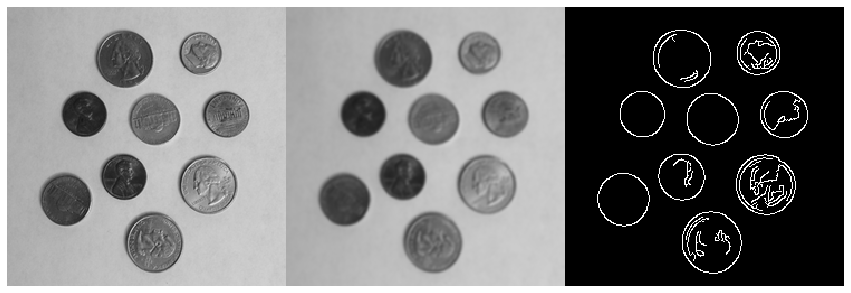

In [17]:
#讀取圖片
img = cv2.imread("coin.png")

#圖片灰階化
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#圖片模糊化
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

#邊緣偵測
canny = cv2.Canny(blurred, 50, 150)

#組圖
result = np.hstack([gray, blurred, canny])

#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
result = cv2.cvtColor(result,cv2.COLOR_BGR2RGB)

#設定顯示圖片大小
plt.figure(figsize=(15,45)) 

#設定要顯示的圖片
plt.imshow(result)

#不顯示座標
plt.axis('off')

#儲存圖片
cv2.imwrite("cv2_img_edge_detection.png", cv2.cvtColor(canny,cv2.COLOR_BGR2RGB))

#顯示圖片
plt.show()

### 調整明暗度跟對比度

請輸入對比度數值 [1.0-3.0]:  2.0
請輸入明亮度數值 [0-100]:  50


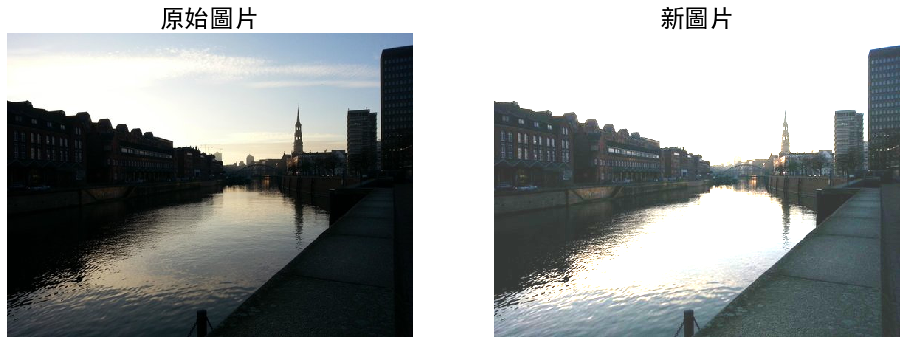

In [18]:
from matplotlib import font_manager

#讀取圖片
img = cv2.imread('bridge.jpg')

#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
rgb_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

##################################
#創造跟原圖片同樣大小的空新numpy陣列
new_img = np.zeros(rgb_img.shape, rgb_img.dtype)
alpha = 1.0 # 調整對比度
beta = 0    # 調整明亮度

#讓使用者輸入想要調整的對比度跟明亮度數值，並做防呆設計
try:
    alpha = float(input('請輸入對比度數值 [1.0-3.0]: '))
    beta = int(input('請輸入明亮度數值 [0-100]: '))
except ValueError:
    print('輸入錯誤，請輸入數字!')

for y in range(rgb_img.shape[0]):
    for x in range(rgb_img.shape[1]):
        for c in range(rgb_img.shape[2]):
            new_img[y,x,c] = np.clip(alpha*rgb_img[y,x,c] + beta, 0, 255)

##################################

#設定字體
fontPath = "SimHei.ttf"
prop = font_manager.FontProperties(fname=fontPath,size=25)

#設定顯示圖片大小
plt.figure(figsize=(16,32)) 

#設定原圖為一行兩列當中的第一張圖片
plt.subplot(1,2,1)     
plt.title('原始圖片', fontproperties=prop)  
#設定要顯示的圖片
plt.imshow(rgb_img)
#不顯示座標
plt.axis('off')

#設定調整過後的圖為一行兩列當中的第二張圖片
plt.subplot(1,2,2)  
plt.title('新圖片', fontproperties=prop)
#設定要顯示的圖片
plt.imshow(new_img)
#不顯示座標
plt.axis('off')

cv2.imwrite("cv2_img_contrast_brightness.png", cv2.cvtColor(new_img,cv2.COLOR_BGR2RGB))
plt.show()

### 改變圖片大小-縮放

+ resize(原始圖片, 尺寸大小)

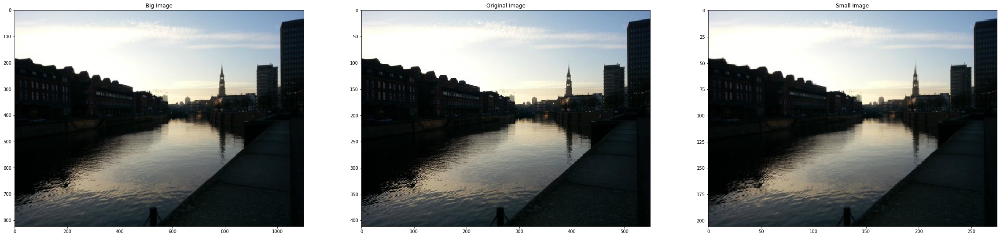

In [19]:
#讀取圖片
img = cv2.imread('bridge.jpg')

#獲取圖片的寬高
h, w = img.shape[0:2]

#修改圖片大小
small_img = cv2.resize(img, (int(w/2), int(h/2)))
big_img = cv2.resize(img, (int(w*2), int(h*2)))

#設定顯示圖片大小
plt.figure(figsize=(40,40)) 

#設定大圖為一行三列當中的第一張圖片
plt.subplot(1,3,1)     
plt.title('Big Image')  
#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
big_img = cv2.cvtColor(big_img,cv2.COLOR_BGR2RGB)
#設定要顯示的圖片
plt.imshow(big_img)


#設定原圖為一行三列當中的第二張圖片
plt.subplot(1,3,2)  
plt.title('Original Image')
#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
#設定要顯示的圖片
plt.imshow(img)


#設定原圖為一行三列當中的第三張圖片
plt.subplot(1,3,3)     
plt.title('Small Image')  
#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
small_img = cv2.cvtColor(small_img,cv2.COLOR_BGR2RGB)
#設定要顯示的圖片
plt.imshow(small_img)


#儲存圖片
cv2.imwrite("cv2_img_bigger.png", cv2.cvtColor(big_img,cv2.COLOR_BGR2RGB))
cv2.imwrite("cv2_img_smaller.png", cv2.cvtColor(small_img,cv2.COLOR_BGR2RGB))

#顯示圖片
plt.show()

### 加上不同圖形: 線條、方框、圓形

+ 直線-line(影像, 開始座標, 結束座標, 顏色, 線條寬度)
+ 圓形-circle(影像, 圓心座標, 半徑, 顏色, 線條寬度)
+ 方形-rectangle(影像, 頂點座標, 對向頂點座標, 顏色, 線條寬度)

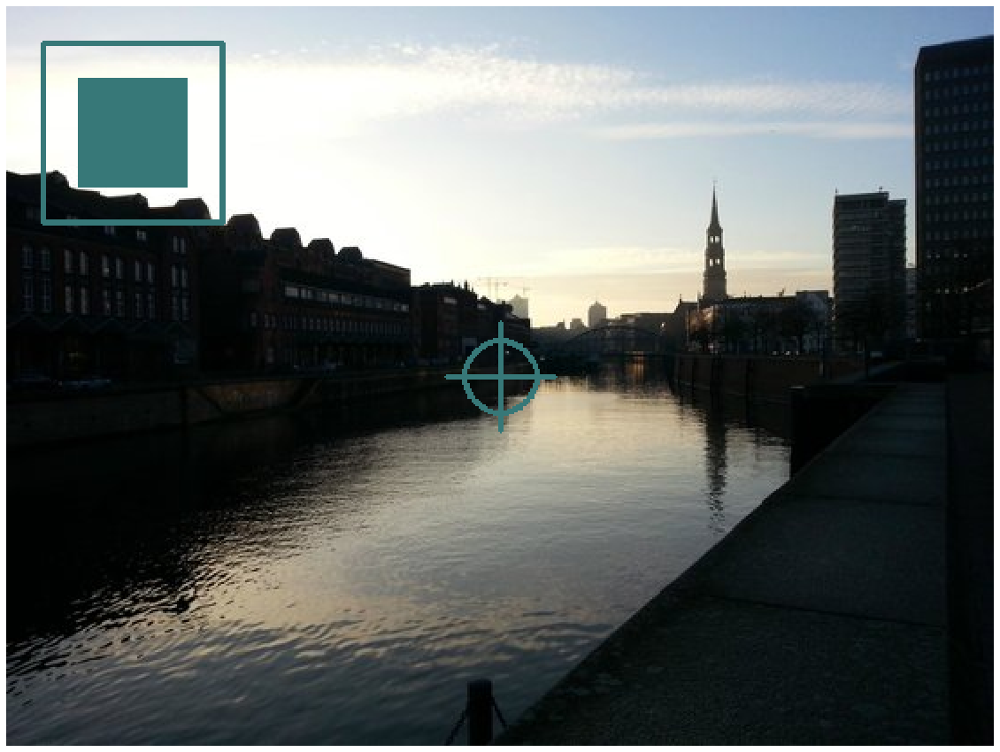

In [20]:
#讀取圖片
img = cv2.imread("bridge.jpg")

#獲取圖片的寬高
h, w = img.shape[0:2]

#設定十字長度的一半
cross = 30

#繪製十字
cv2.line(img, (int(w/2-cross), int(h/2)), (int(w/2+cross), int(h/2)), (120, 120, 55), 2)
cv2.line(img, (int(w/2), int(h/2-cross)), (int(w/2), int(h/2+cross)), (120, 120, 55), 2)

#繪製圓
cv2.circle(img,(int(w/2),int(h/2)),cross-10,(120,120,55),2)

#繪製虛心方框
cv2.rectangle(img, (20, 20), (120, 120), (120, 120, 55), 2)

#繪製實心方框
cv2.rectangle(img, (40, 40), (100, 100), (120, 120, 55), -1)

#將OpenCV的BGR格式轉成matplotlib看得懂的RGB格式
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#設定顯示圖片大小
plt.figure(figsize=(20,30)) 

#設定要顯示的圖片
plt.imshow(img)

#不顯示座標
plt.axis('off')

#儲存圖片
cv2.imwrite("cv2_img_shape.png", cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

#顯示圖片
plt.show()

# 人臉偵測

### Step1. 匯入函式庫、找到haarcascades所在路徑

In [21]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

print(cv2.data.haarcascades)
print("\n在此路徑底下的檔案有：\n")
for file in os.listdir(cv2.data.haarcascades):
    print(os.path.join(file))

C:\Users\ADMIN\Anaconda3\lib\site-packages\cv2\data\

在此路徑底下的檔案有：

haarcascade_eye.xml
haarcascade_eye_tree_eyeglasses.xml
haarcascade_frontalcatface.xml
haarcascade_frontalcatface_extended.xml
haarcascade_frontalface_alt.xml
haarcascade_frontalface_alt2.xml
haarcascade_frontalface_alt_tree.xml
haarcascade_frontalface_default.xml
haarcascade_fullbody.xml
haarcascade_lefteye_2splits.xml
haarcascade_licence_plate_rus_16stages.xml
haarcascade_lowerbody.xml
haarcascade_profileface.xml
haarcascade_righteye_2splits.xml
haarcascade_russian_plate_number.xml
haarcascade_smile.xml
haarcascade_upperbody.xml
__init__.py
__pycache__


### Step2. 使用haarcascade_frontalface_default.xml資料來辨識人臉

In [22]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades+'haarcascade_frontalface_default.xml')

### Step3. 確認face_cascade有讀到資料

In [23]:
not face_cascade.empty()

True

### Step4. 讀取圖片

In [24]:
img = cv2.imread('maroon5.jpg')

### Step5. 將圖片灰階化(grayscale)

In [25]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

### Step6. 偵測圖片中人臉

detectMultiScale中參數依序如下:

+ 圖片
+ ScaleFactor：每次搜尋方塊減少的比例
+ minNeighbers：每個目標至少檢測到幾次以上，才可被認定是真數據。
+ minSize：設定數據搜尋的最小尺寸

In [26]:
faces = face_cascade.detectMultiScale(gray,
                                      scaleFactor=1.2,
                                      minNeighbors=5,
                                      minSize=(50,50))

### Step7. 在偵測到的人臉周遭畫框框

cv2.rectangle用於畫方框，參數依序如下:

+ 圖片
+ 兩個對角座標
+ 線的顏色(RGB)
+ 線的粗細(pixel)

In [27]:
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

### Step8. 顯示圖片偵測人臉結果

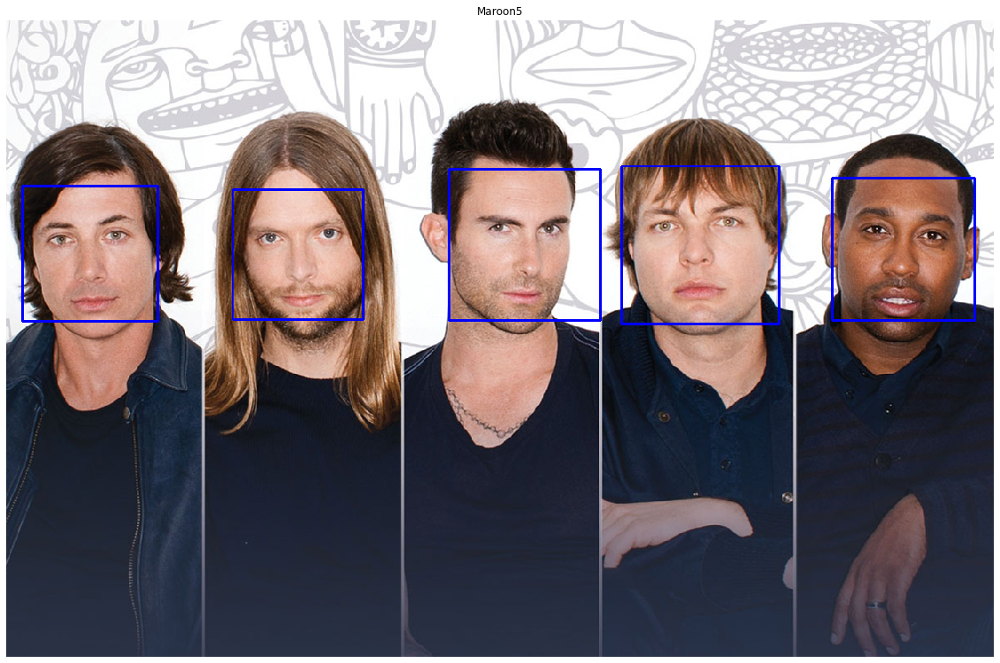

In [28]:
cv2.imwrite('result.jpg', img)

plt.figure(figsize = (20,20))
rgb_img = (cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.imshow(rgb_img)
plt.title("Maroon5")
plt.axis('off')
plt.show()